# Weather: Wind Speed – TEMPLATE

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Initialization" data-toc-modified-id="Initialization-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Initialization</a></span></li><li><span><a href="#Analysis-and-Transformation" data-toc-modified-id="Analysis-and-Transformation-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Analysis and Transformation</a></span></li><li><span><a href="#Hyper-Parameters-Search" data-toc-modified-id="Hyper-Parameters-Search-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Hyper Parameters Search</a></span></li><li><span><a href="#Training-and-Validation" data-toc-modified-id="Training-and-Validation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Training and Validation</a></span><ul class="toc-item"><li><span><a href="#Scores" data-toc-modified-id="Scores-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Scores</a></span></li><li><span><a href="#Distributions-of-Validation-Errors" data-toc-modified-id="Distributions-of-Validation-Errors-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Distributions of Validation Errors</a></span></li><li><span><a href="#Visualization-of-Validation-Predictions" data-toc-modified-id="Visualization-of-Validation-Predictions-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Visualization of Validation Predictions</a></span></li></ul></li></ul></div>

## Initialization

In [1]:
# !pip install --use-feature=in-tree-build psutil requests pmdarima nb_black

In [2]:
# !pip install --use-feature=in-tree-build ../pytorch-fit/
# !pip install --use-feature=in-tree-build git+https://github.com/krzpiesiewicz/pytorch-fit

In [3]:
# !pip install --use-feature=in-tree-build ../timeseries/
# !pip install --use-feature=in-tree-build git+https://github.com/krzpiesiewicz/timeseries

In [4]:
%load_ext nb_black
%load_ext autoreload
%autoreload 2
%aimport timeseries

<IPython.core.display.Javascript object>

In [5]:
import os
import sys
import time
import IPython.display
from pprint import pprint
import matplotlib.colors as mcolors
from datetime import datetime, timedelta
import numpy as np
import pandas as pd

import timeseries as tss
from timeseries import plot_ts
from timeseries.analysis import acf, pacf, plot_hist, plot_acf, plot_pacf, plot_stats
from timeseries.transform import IHSTransformer, get_smoothed
from timeseries.forecast.utils import Results
from timeseries.forecast.utils import (
    plot_model_test_prediction,
    plot_ground_truth,
    plot_hist_model_scores,
)
from timeseries.forecast.scorings import get_comparison_scorings
from timeseries.forecast import average_scores
from timeseries.forecast.hyper_params import (
    make_grid,
    grid_search_hyper_params,
    print_hyper_scores,
    sorted_scores,
)
from timeseries.forecast.models import (
    SarimaModel,
    sarima_model_version,
    sarima_model_version_str,
)

from timeseries_data import WindSpeedData

<IPython.core.display.Javascript object>

In [6]:
import nb_black

from notebook_init import notebook_init

notebook_init()

<IPython.core.display.Javascript object>

In [7]:
scorings = get_comparison_scorings()

ts_data = WindSpeedData()
data_type = ts_data.data_type
data_name = ts_data.data_name

val_results = Results(data_type, data_name, "val")

ts = ts_data.ts
train_intv = ts_data.train_interval
val_intv = ts_data.val_interval
pred_steps = ts_data.pred_steps
pred_jump = ts_data.pred_jump

<IPython.core.display.Javascript object>

## Analysis and Transformation

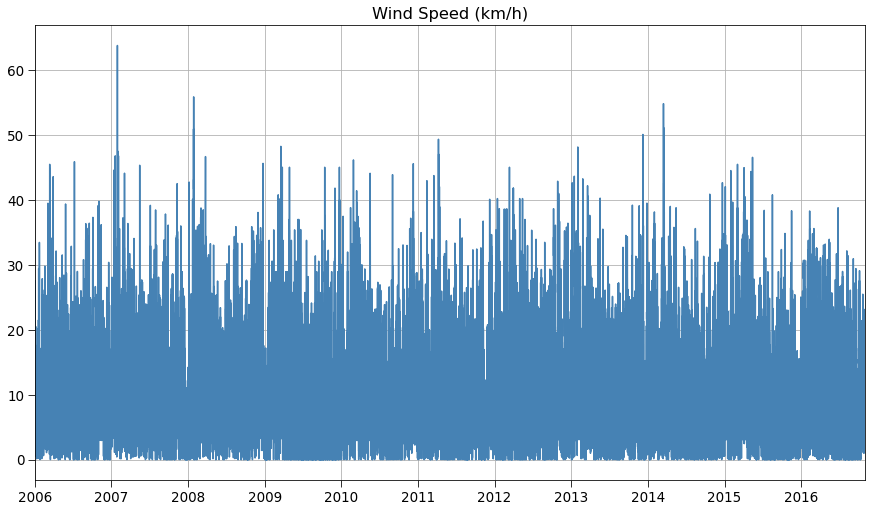

<IPython.core.display.Javascript object>

In [8]:
plot_ts(ts)

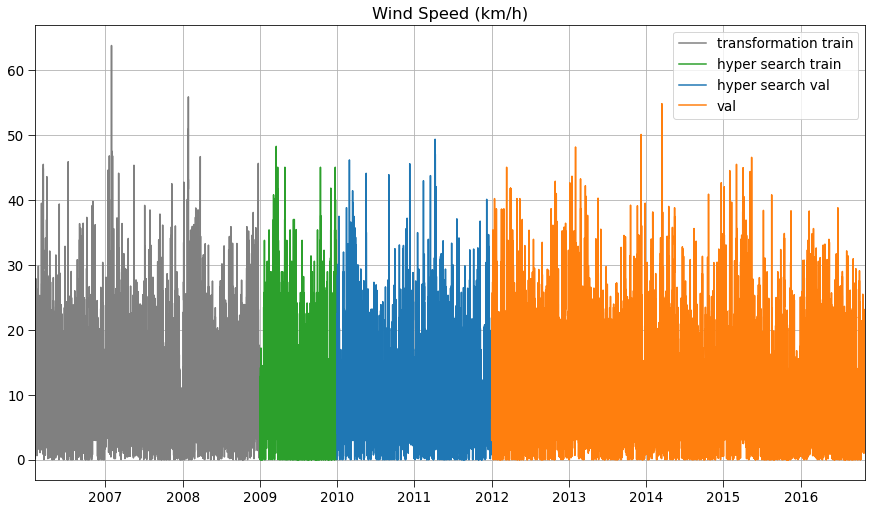

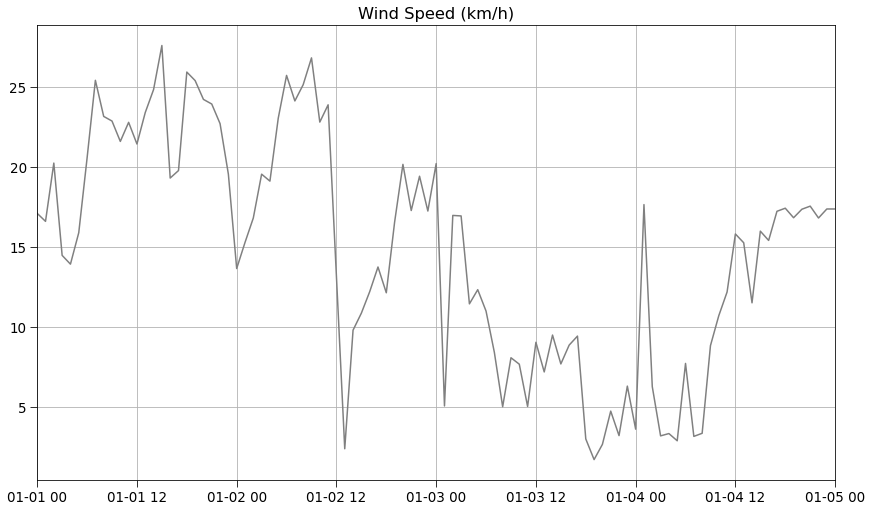

<IPython.core.display.Javascript object>

In [9]:
transformation_train_intv = tss.Interval(ts, train_intv.begin, datetime(2009, 1, 1))
hyper_search_train_intv = tss.Interval(
    ts, transformation_train_intv.end, datetime(2010, 1, 1)
)
hyper_search_val_intv = tss.Interval(ts, hyper_search_train_intv.end, val_intv.begin)
hyper_search_intv = tss.Interval(
    ts, hyper_search_train_intv.begin, hyper_search_val_intv.end
)

fig = plot_ts(
    transformation_train_intv.view(ts), color="grey", name="transformation train"
)
plot_ts(
    hyper_search_train_intv.view(),
    color="tab:green",
    fig=fig,
    name="hyper search train",
)
plot_ts(
    hyper_search_val_intv.view(), color="tab:blue", fig=fig, name="hyper search val"
)
plot_ts(val_intv.view(ts), color="tab:orange", fig=fig, name="val")
display(fig)
display(plot_ts(ts[: datetime(2006, 1, 5)], color="grey"))

skewness of original ts on transformation train inteval: 1.19906


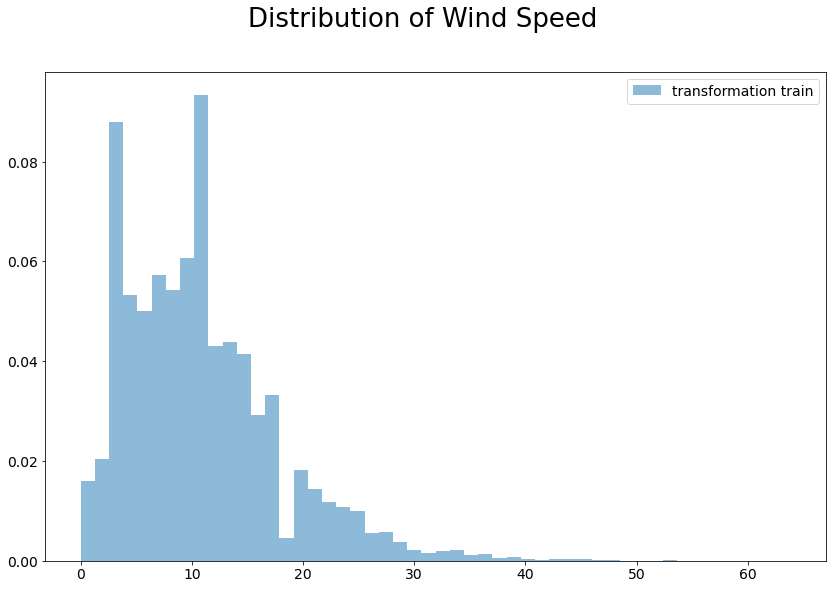

<IPython.core.display.Javascript object>

In [10]:
print(
    "skewness of original ts on transformation train inteval: "
    f"{transformation_train_intv.view(ts).skew():.5f}"
)
fig = plot_hist(
    transformation_train_intv.view(ts),
    bins=50,
    density=True,
    name="transformation train",
    title=f"Distribution of {data_name}",
)
display(fig)

skewness of ordinary normalized time series on transformation train inteval: 1.19906
skewness of ordinary normalized time series on hyper-search inteval: 1.11368


MLE of IHS lambda: 1.868750e-01


skewness of normalized time series with IHS on transformation train inteval: -0.07709
skewness of normalized time series with IHS on hyper-search inteval: -0.13341


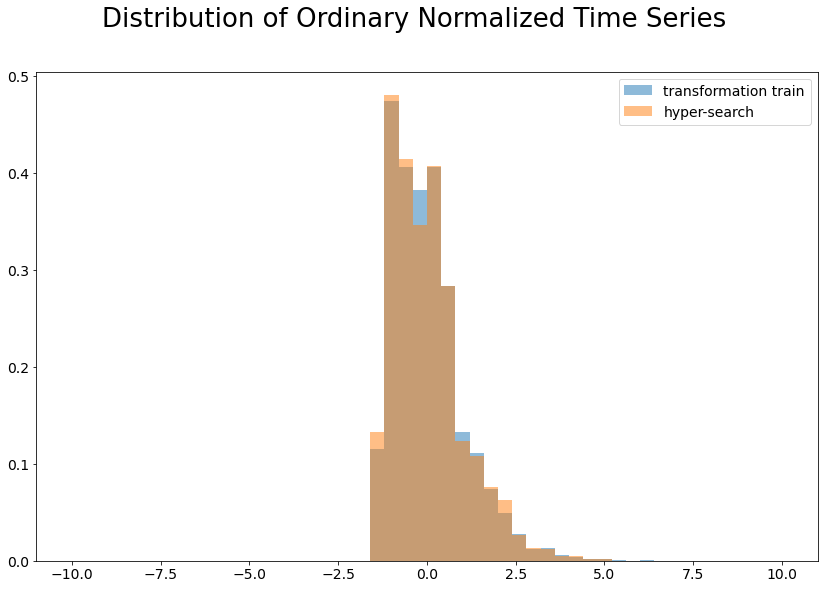

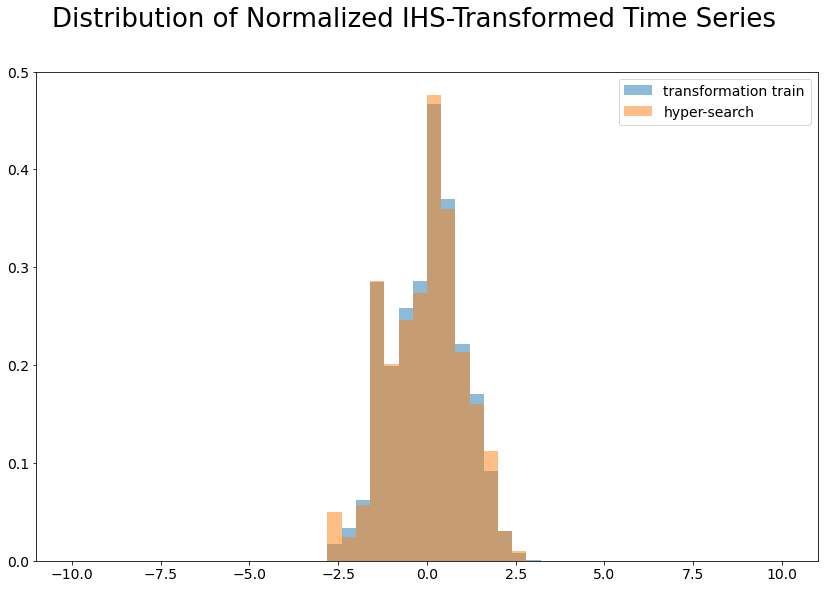

<IPython.core.display.Javascript object>

In [11]:
trans_without_diff = IHSTransformer(
    transformation_train_intv.view(ts), d=0, lmb=None, verbose=True
)
trans_without_diff_ts = trans_without_diff.transform(ts)
print(
    f"skewness of ordinary normalized time series on transformation train inteval: "
    f"{transformation_train_intv.view(trans_without_diff_ts).skew():.5f}"
)
print(
    f"skewness of ordinary normalized time series on hyper-search inteval: "
    f"{hyper_search_intv.view(trans_without_diff_ts).skew():.5f}"
)


ihs_trans_without_diff = IHSTransformer(
    transformation_train_intv.view(ts), d=0, verbose=True
)
ihs_trans_without_diff_ts = ihs_trans_without_diff.transform(ts)
print(
    f"skewness of normalized time series with IHS on transformation train inteval: "
    f"{transformation_train_intv.view(ihs_trans_without_diff_ts).skew():.5f}"
)
print(
    f"skewness of normalized time series with IHS on hyper-search inteval: "
    f"{hyper_search_intv.view(ihs_trans_without_diff_ts).skew():.5f}"
)
time.sleep(1)

fig = plot_hist(
    transformation_train_intv.view(trans_without_diff_ts),
    bins=50,
    range=(-10, 10),
    density=True,
    name="transformation train",
    title="Distribution of Ordinary Normalized Time Series",
)
display(
    plot_hist(
        hyper_search_intv.view(trans_without_diff_ts),
        bins=50,
        range=(-10, 10),
        density=True,
        name="hyper-search",
        fig=fig,
    )
)

fig = plot_hist(
    transformation_train_intv.view(ihs_trans_without_diff_ts),
    bins=50,
    range=(-10, 10),
    density=True,
    name="transformation train",
    title="Distribution of Normalized IHS-Transformed Time Series",
)
display(
    plot_hist(
        hyper_search_intv.view(ihs_trans_without_diff_ts),
        bins=50,
        range=(-10, 10),
        density=True,
        name="hyper-search",
        fig=fig,
    )
)

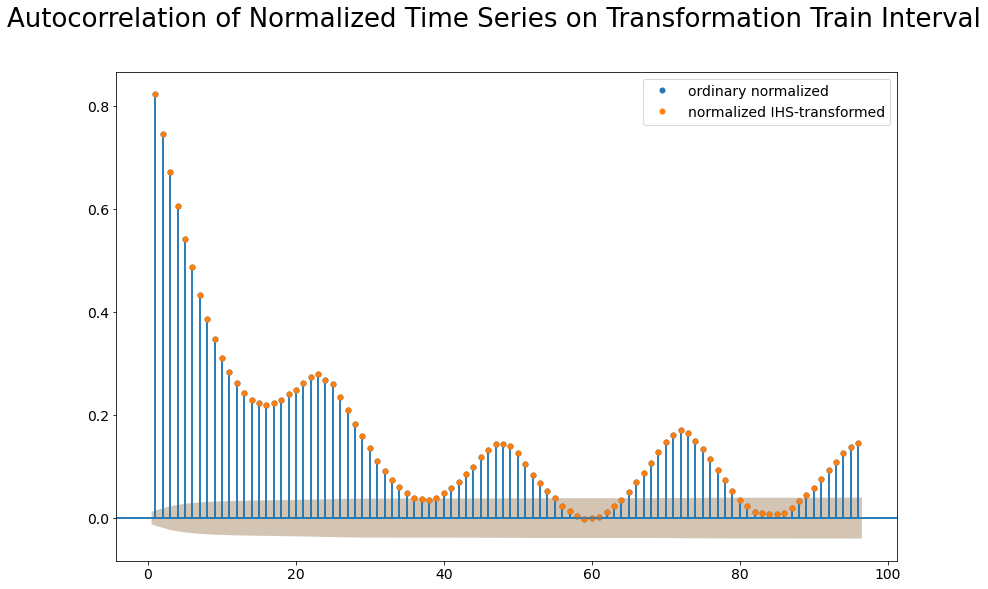

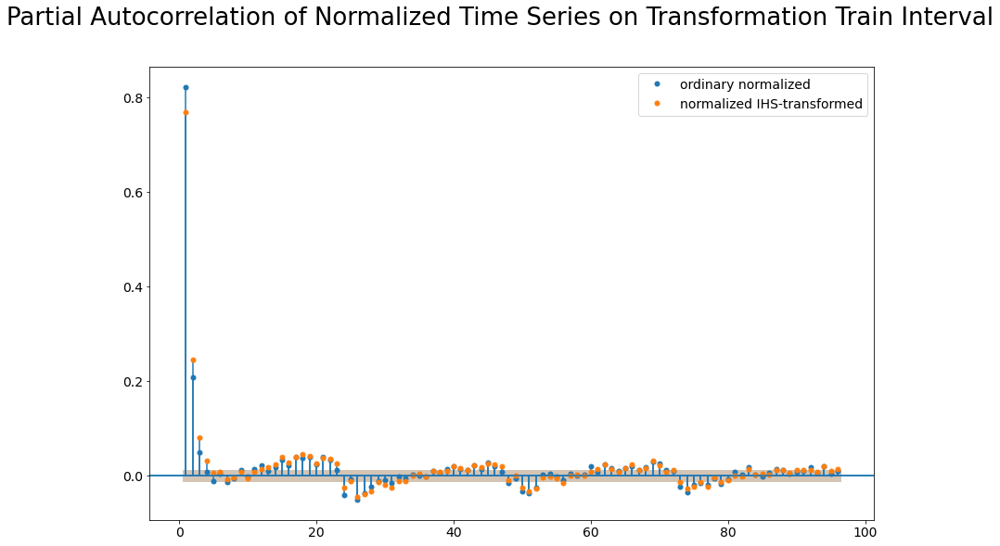

<IPython.core.display.Javascript object>

In [12]:
alpha = 0.05
nlags = 24 * 4
fig = plot_acf(
    transformation_train_intv.view(trans_without_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    label="ordinary normalized",
    title="Autocorrelation of Normalized Time Series on Transformation Train Interval",
)
plot_acf(
    transformation_train_intv.view(trans_without_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    label="normalized IHS-transformed",
    fig=fig,
)
display(fig)

alpha = 0.05
pacf_method = "ldbiased"
fig = plot_pacf(
    transformation_train_intv.view(trans_without_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    method=pacf_method,
    label="ordinary normalized",
    title="Partial Autocorrelation of Normalized Time Series on Transformation Train Interval",
)
plot_pacf(
    transformation_train_intv.view(ihs_trans_without_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    method=pacf_method,
    label="normalized IHS-transformed",
    fig=fig,
)
display(fig)

In [14]:
fig = plot_ts(
    trans_without_diff_ts[: datetime(2007, 1, 5)],
    name="ordinary normalized",
    color="tab:blue",
    engine="plotly",
)
plot_ts(
    ihs_trans_without_diff_ts[: datetime(2007, 1, 5)],
    color="tab:orange",
    name="normalized IHS-transformed",
    fig=fig,
)
display(fig)

<IPython.core.display.Javascript object>

In [15]:
ordinary_trans = IHSTransformer(
    transformation_train_intv.view(ts), lmb=None, verbose=True
)
ordinary_normalized_diffs = ordinary_trans.transform(ts)
print(
    f"skewness of ordinary normalized differences on transformation train inteval: "
    f"{transformation_train_intv.view(ordinary_normalized_diffs).skew():.5f}"
)
print(
    "skewness of ordinary normalized differences on hyper-search val inteval: "
    f"{hyper_search_val_intv.view(ordinary_normalized_diffs).skew():.5f}"
)
time.sleep(1)

normalized_ihs_after_diff_trans = IHSTransformer(
    transformation_train_intv.view(ts), verbose=True
)
normalized_ihs_after_diff_ts = normalized_ihs_after_diff_trans.transform(ts)
print(
    f"skewness of normalized IHS-transformed differences on transformation train inteval: "
    f"{transformation_train_intv.view(normalized_ihs_after_diff_ts).skew():.5f}"
)
print(
    f"skewness of normalized IHS-transformed differences on hyper-search val inteval: "
    f"{hyper_search_val_intv.view(normalized_ihs_after_diff_ts).skew():.5f}"
)
time.sleep(1)

normalized_diff_after_ihs_trans = IHSTransformer(
    transformation_train_intv.view(ts), ihs_after_diff=True, verbose=True
)
normalized_diff_after_ihs_ts = normalized_diff_after_ihs_trans.transform(ts)
print(
    f"skewness of normalized differenced IHS-transformed time series on transformation train inteval: "
    f"{transformation_train_intv.view(normalized_diff_after_ihs_ts).skew():.5f}"
)
print(
    f"skewness of normalized differenced IHS-transformed time series on hyper-search val inteval: "
    f"{hyper_search_val_intv.view(normalized_diff_after_ihs_ts).skew():.5f}"
)

Order of differencing: 1


skewness of ordinary normalized differences on transformation train inteval: 0.14840
skewness of ordinary normalized differences on hyper-search val inteval: 0.10844


Order of differencing: 1
MLE of IHS lambda: 2.318750e-01


skewness of normalized IHS-transformed differences on transformation train inteval: 0.03798
skewness of normalized IHS-transformed differences on hyper-search val inteval: 0.00804


Order of differencing: 1
MLE of IHS lambda: 1.868750e-01


skewness of normalized differenced IHS-transformed time series on transformation train inteval: 0.09287
skewness of normalized differenced IHS-transformed time series on hyper-search val inteval: 0.03802


<IPython.core.display.Javascript object>

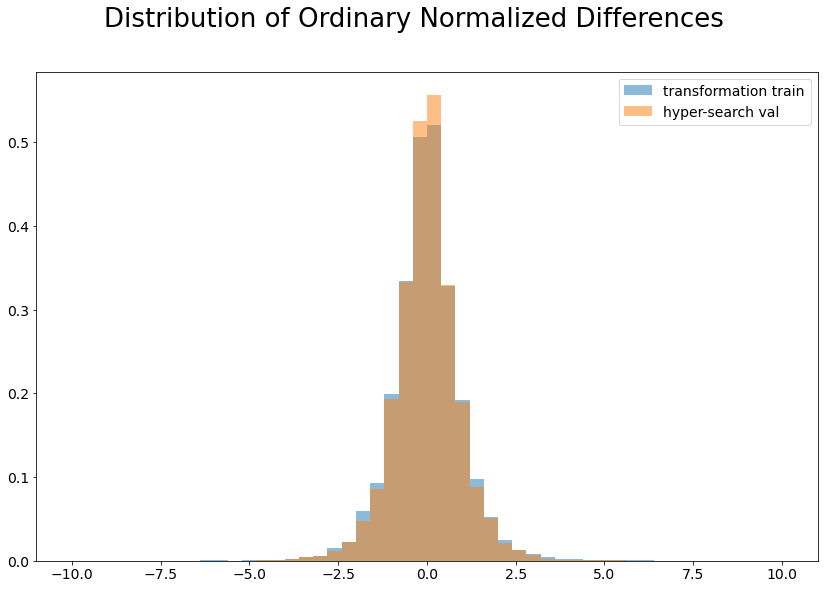

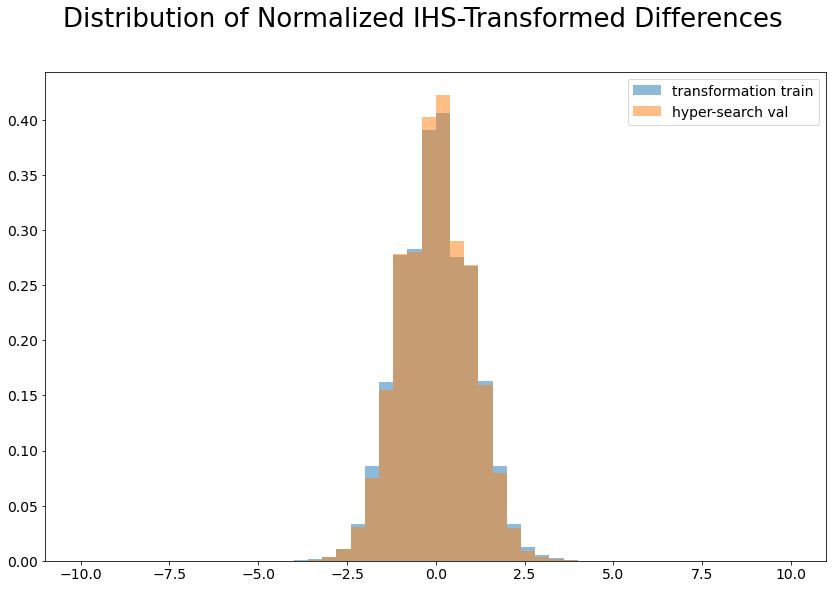

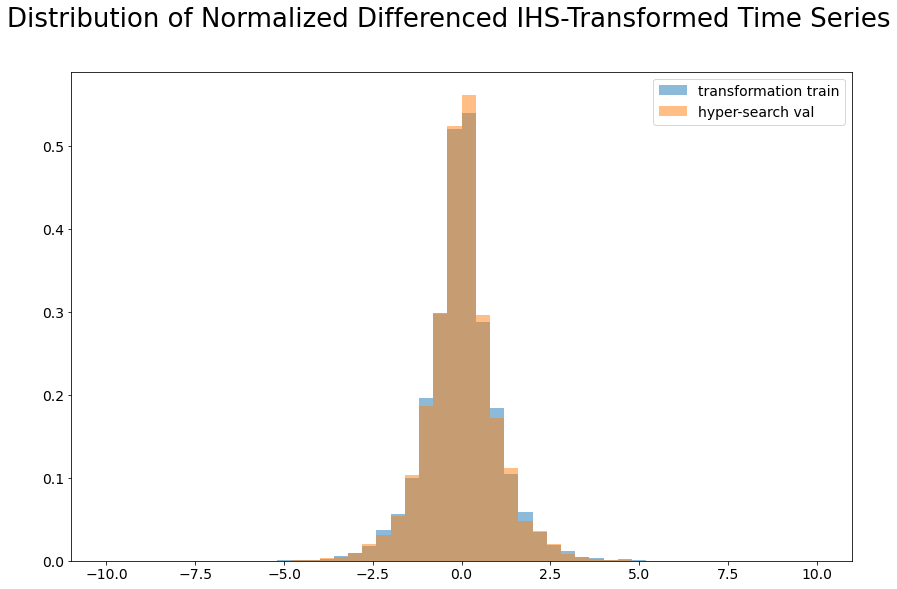

<IPython.core.display.Javascript object>

In [16]:
fig = plot_hist(
    transformation_train_intv.view(ordinary_normalized_diffs),
    bins=50,
    range=(-10, 10),
    density=True,
    name="transformation train",
    title="Distribution of Ordinary Normalized Differences",
)
display(
    plot_hist(
        hyper_search_val_intv.view(ordinary_normalized_diffs),
        bins=50,
        range=(-10, 10),
        density=True,
        name="hyper-search val",
        fig=fig,
    )
)

fig = plot_hist(
    transformation_train_intv.view(normalized_ihs_after_diff_ts),
    bins=50,
    range=(-10, 10),
    density=True,
    name="transformation train",
    title="Distribution of Normalized IHS-Transformed Differences",
)
display(
    plot_hist(
        hyper_search_val_intv.view(normalized_ihs_after_diff_ts),
        bins=50,
        range=(-10, 10),
        density=True,
        name="hyper-search val",
        fig=fig,
    )
)

fig = plot_hist(
    transformation_train_intv.view(normalized_diff_after_ihs_ts),
    bins=50,
    range=(-10, 10),
    density=True,
    name="transformation train",
    title="Distribution of Normalized Differenced IHS-Transformed Time Series",
)
display(
    plot_hist(
        hyper_search_val_intv.view(normalized_diff_after_ihs_ts),
        bins=50,
        range=(-10, 10),
        density=True,
        name="hyper-search val",
        fig=fig,
    )
)

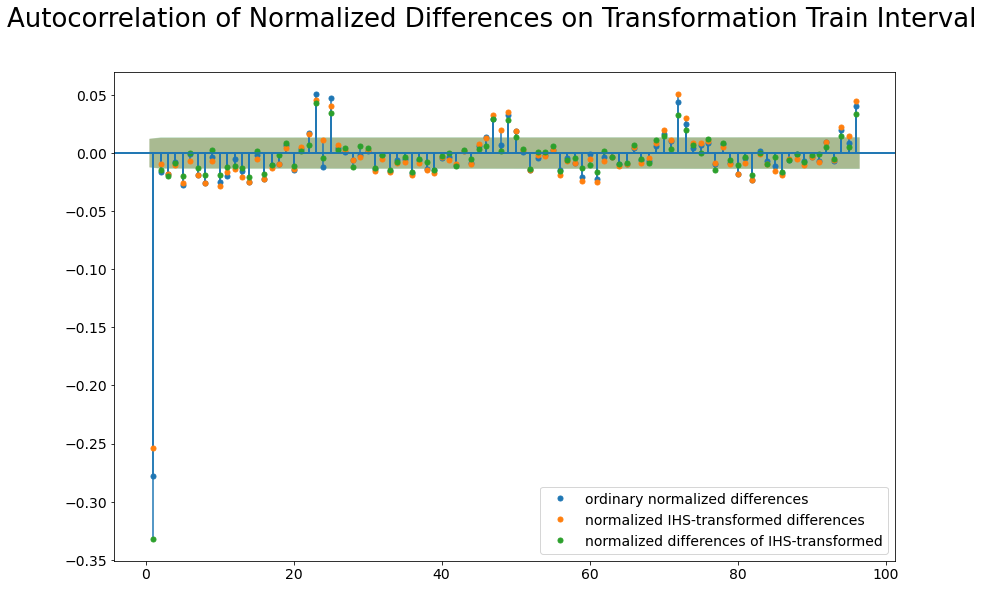

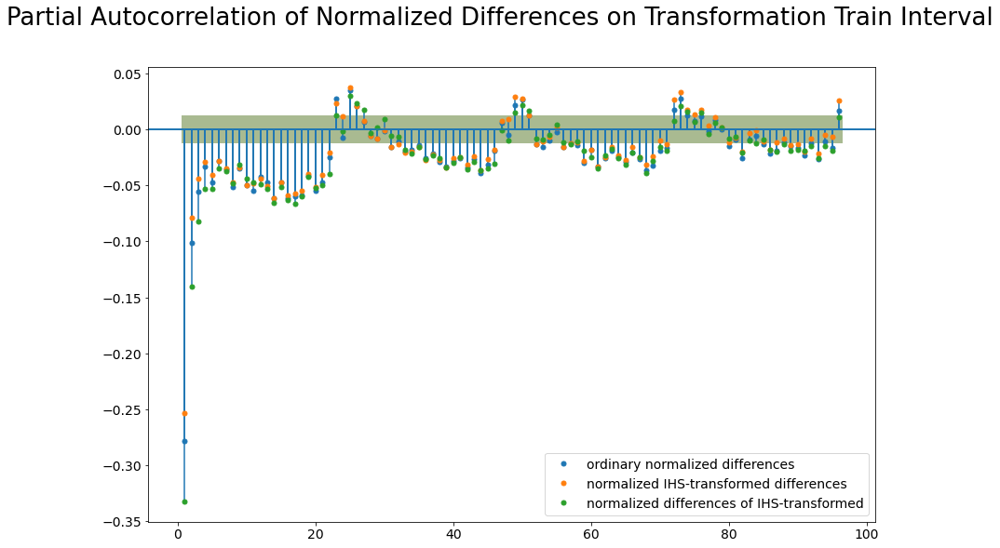

<IPython.core.display.Javascript object>

In [17]:
alpha = 0.05
nlags = 24 * 4
fig = plot_acf(
    transformation_train_intv.view(ordinary_normalized_diffs),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    label="ordinary normalized differences",
    title="Autocorrelation of Normalized Differences on Transformation Train Interval",
)
plot_acf(
    transformation_train_intv.view(normalized_ihs_after_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    label="normalized IHS-transformed differences",
    fig=fig,
)
plot_acf(
    transformation_train_intv.view(normalized_diff_after_ihs_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    label="normalized differences of IHS-transformed",
    fig=fig,
)
display(fig)

alpha = 0.05
pacf_method = "ldbiased"
fig = plot_pacf(
    transformation_train_intv.view(ordinary_normalized_diffs),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    method=pacf_method,
    label="ordinary normalized differences",
    title="Partial Autocorrelation of Normalized Differences on Transformation Train Interval",
)
plot_pacf(
    transformation_train_intv.view(normalized_ihs_after_diff_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    method=pacf_method,
    label="normalized IHS-transformed differences",
    fig=fig,
)
plot_pacf(
    transformation_train_intv.view(normalized_diff_after_ihs_ts),
    alpha=alpha,
    nlags=nlags,
    zero=False,
    method=pacf_method,
    label="normalized differences of IHS-transformed",
    fig=fig,
)
display(fig)

In [18]:
fig = plot_ts(
    ordinary_normalized_diffs[: datetime(2007, 1, 5)],
    name="ordinary normalized differences",
    color="tab:blue",
    engine="plotly",
)
plot_ts(
    normalized_diff_after_ihs_ts[: datetime(2007, 1, 5)],
    color="tab:green",
    name="normalized differences of IHS-transformed",
    fig=fig,
)
plot_ts(
    normalized_ihs_after_diff_ts[: datetime(2007, 1, 5)],
    color="tab:orange",
    name="normalized IHS-transformed differences",
    fig=fig,
)
display(fig)

<IPython.core.display.Javascript object>

## Hyper Parameters Search

In [ ]:
trans = <insert trans>
trans_ts = <insert trans_ts>

In [102]:
alpha = 0.05
trans_ts_acf, _ = acf(transformation_train_intv.view(trans_ts), nlags=48, alpha=alpha)
(trans_ts_acf_idx,) = np.where(np.abs(trans_ts_acf) >= 0.05)

trans_ts_pacf, _ = pacf(
    transformation_train_intv.view(trans_ts), nlags=48, alpha=alpha
)
(trans_ts_pacf_idx,) = np.where(np.abs(trans_ts_pacf) >= 0.05)

print(f"acf: {trans_ts_acf_idx}")
print(f"pacf: {trans_ts_pacf_idx}")

acf: [ 0  1 23]
pacf: [ 0  1  2  3  8 11 14 16 17 18 20]


<IPython.core.display.Javascript object>

P ≥ 1 if the ACF is positive at lag s, else P=0.

Q ≥ 1 if the ACF is negative at lag s, else Q=0.

Rule of thumb: P + Q ≤ 2

In [17]:
trans_ts_acf[24]

-0.01162881185639764

<IPython.core.display.Javascript object>

In [ ]:
plot_stats(trans_ts_acf[23:30], xs=np.arange(23, 30))

In [ ]:
plot_stats(trans_ts_pacf[23:30], xs=np.arange(23, 30))

In [116]:
def sarima_grid_search(scores=None):
    return grid_search_hyper_params(
        SarimaModel,
        grid,
        trans_ts,
        hyper_search_train_intv,
        hyper_search_val_intv,
        model_params=model_params,
        score_params=score_params,
        fit_params=fit_params,
        best=None,
        scores=scores,
    )

<IPython.core.display.Javascript object>

In [117]:
score_params = dict(
    scorings=["mae"],
    trans=trans,
    original_ts=ts,
    n_steps=pred_steps,
    n_steps_jump=125,
    mute=True,
)

fit_params = dict(scoring="mae")

<IPython.core.display.Javascript object>

In [128]:
%%time
p_range = trans_ts_pacf_idx
d_range = [0]
q_range = trans_ts_acf_idx
D_range = [0, 1]
P_range = [0, 1]
Q_range = [0, 1, 2]
grid = make_grid(p=p_range, d=d_range, q=q_range, P=P_range, D=D_range, Q=Q_range)
grid = [v for v in grid if v["p"] + v["d"] + v["q"] + v["P"] + v["D"] + v["Q"] <= 8]

model_params = dict(s=24, max_ts_len=24 * 50, retrain_ts_len=24 * 30)

sarima_grid_search_scores = []
sarima_grid_search_scores1 = sarima_grid_search(sarima_grid_search_scores)

78/78 (8h 10min 44s), the best of all: 4.512 (p=2, d=0, q=1, P=0, D=1, Q=1)                                   


CPU times: user 18h 47min 46s, sys: 10h 9min 10s, total: 1d 4h 56min 56s
Wall time: 8h 10min 45s


<IPython.core.display.Javascript object>

In [129]:
version_suffix = <insert version suffix>

<IPython.core.display.Javascript object>

In [130]:
print_hyper_scores(
    sarima_grid_search_scores1[:30],
    sarima_model_version_str,
    s=24,
    suffix=version_suffix,
)

1.   4.512 – SARIMA(2,0,1)(0,1,1)[24] on ordinary diffs
2.   4.555 – SARIMA(3,0,1)(1,0,1)[24] on ordinary diffs
3.   4.576 – SARIMA(2,0,1)(0,1,2)[24] on ordinary diffs
4.   4.578 – SARIMA(2,0,1)(1,0,1)[24] on ordinary diffs
5.   4.657 – SARIMA(2,0,1)(0,0,2)[24] on ordinary diffs
6.   4.657 – SARIMA(3,0,1)(0,0,2)[24] on ordinary diffs
7.   4.691 – SARIMA(3,0,1)(0,0,1)[24] on ordinary diffs
8.   4.693 – SARIMA(3,0,1)(1,0,0)[24] on ordinary diffs
9.   4.697 – SARIMA(2,0,1)(1,0,0)[24] on ordinary diffs
10.  4.717 – SARIMA(2,0,1)(0,0,1)[24] on ordinary diffs
11.  4.718 – SARIMA(3,0,1)(0,0,0)[24] on ordinary diffs
12.  4.731 – SARIMA(2,0,1)(0,0,0)[24] on ordinary diffs
13.  4.743 – SARIMA(1,0,1)(1,0,1)[24] on ordinary diffs
14.  4.748 – SARIMA(3,0,1)(0,1,1)[24] on ordinary diffs
15.  4.987 – SARIMA(1,0,1)(0,1,2)[24] on ordinary diffs
16.  5.059 – SARIMA(2,0,1)(1,1,0)[24] on ordinary diffs
17.  5.069 – SARIMA(1,0,1)(1,1,1)[24] on ordinary diffs
18.  5.071 – SARIMA(3,0,1)(1,1,0)[24] on ordinar

<IPython.core.display.Javascript object>

In [131]:
sarima_grid_search_scores1

[(4.51176026785072, {'p': 2, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 1}),
 (4.555128974860224, {'p': 3, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 1}),
 (4.576158807924069, {'p': 2, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 2}),
 (4.5781206410152455, {'p': 2, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 1}),
 (4.656986672411135, {'p': 2, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 2}),
 (4.657445882590427, {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 2}),
 (4.690995312141311, {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1}),
 (4.692878984436306, {'p': 3, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 0}),
 (4.696666131784368, {'p': 2, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 0}),
 (4.71711449186385, {'p': 2, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1}),
 (4.717530683947135, {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0}),
 (4.730840674841894, {'p': 2, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 0}),
 (4.7425196603757955, {'p': 1, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 1}),
 (4.747567272904946, {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q

<IPython.core.display.Javascript object>

In [38]:
chosen_versions = [
    sarima_grid_search_scores1[i]
    for i in [<insert indices>]
]
print_hyper_scores(
    chosen_versions, sarima_model_version_str, s=24, suffix=version_suffix
)

1.   4.527 – SARIMA(2,0,1)(0,1,1)[24] on ordinary diffs
2.   4.575 – SARIMA(3,0,1)(1,0,1)[24] on ordinary diffs
3.   4.596 – SARIMA(2,0,1)(0,1,2)[24] on ordinary diffs
4.   4.643 – SARIMA(2,0,1)(1,0,1)[24] on ordinary diffs
5.   4.736 – SARIMA(3,0,1)(0,0,2)[24] on ordinary diffs


<IPython.core.display.Javascript object>

## Training and Validation

In [62]:
models_vals = {
    sarima_model_version_str(val, s=24, suffix=version_suffix): dict(val, s=24)
    for (_, val) in chosen_versions
}
models_full_name_versions = list(models_vals.keys())
models_versions = [
    sarima_model_version(val, suffix=version_suffix)[1]
    for (_, val) in models_vals.items()
]
models = {
    version: SarimaModel(**val, max_ts_len=24 * 50, retrain_ts_len=24 * 30)
    for version, val in models_vals.items()
}

val_mean_scores = {}
val_all_scores = {}
val_preds = {}


def train_and_val_model(model_idx):
    full_model_name = models_full_name_versions[model_idx]
    model_version = models_versions[model_idx]
    print(f"{model_idx+1}. {full_model_name}:", file=sys.stderr)
    model = models[full_model_name]
    model.fit(
        trans_ts,
        tss.Interval(ts, train_intv.end - timedelta(days=50), train_intv.end),
        scoring="mae",
    )
    (
        val_mean_scores[full_model_name],
        val_all_scores[full_model_name],
        val_preds[full_model_name],
    ) = average_scores(
        model,
        trans_ts,
        val_intv,
        scorings=scorings,
        trans=trans,
        original_ts=ts,
        n_steps=pred_steps,
        n_steps_jump=pred_jump,
        return_all_scores=True,
        return_preds=True,
    )
    model_name, _ = sarima_model_version(models_vals[full_model_name])
    val_results.set_model(model_name, model_version)
    val_results.add_model_scores(val_all_scores[full_model_name])
    val_results.add_model_preds(val_preds[full_model_name])
    print(f"results saved", file=sys.stderr)
    time.sleep(0.5)

<IPython.core.display.Javascript object>

In [64]:
%%time
train_and_val_model(0)

1. SARIMA(2,0,1)(0,1,1)[24] on ordinary diffs:
1694/1694 – RMSE: 6.213, MAE: 5.257, MASE: 2.057, sMAPE: 58.176, elapsed time: 1h 36min 32s (last: 4.5s)      results saved


CPU times: user 3h 45min 8s, sys: 2h 23min 35s, total: 6h 8min 43s
Wall time: 1h 37min 31s


<IPython.core.display.Javascript object>

In [63]:
%%time
train_and_val_model(1)

2. SARIMA(3,0,1)(1,0,1)[24] on ordinary diffs:
1694/1694 – RMSE: 5.677, MAE: 4.739, MASE: 1.859, sMAPE: 48.809, elapsed time: 4h 50min 49s (last: 2.3s)      s)      results saved


CPU times: user 2h 6min 57s, sys: 1h 25min 20s, total: 3h 32min 18s
Wall time: 4h 51min 14s


<IPython.core.display.Javascript object>

In [65]:
%%time
train_and_val_model(2)

3. SARIMA(2,0,1)(0,1,2)[24] on ordinary diffs:
1694/1694 – RMSE: 6.097, MAE: 5.150, MASE: 2.018, sMAPE: 56.367, elapsed time: 3h 2min 51s (last: 7.0s)        results saved


CPU times: user 8h 15min 30s, sys: 3h 27min 27s, total: 11h 42min 57s
Wall time: 3h 4min 10s


<IPython.core.display.Javascript object>

In [66]:
%%time
train_and_val_model(3)

4. SARIMA(2,0,1)(1,0,1)[24] on ordinary diffs:
1694/1694 – RMSE: 5.727, MAE: 4.787, MASE: 1.880, sMAPE: 49.169, elapsed time: 34min 47s (last: 1.5s)      results saved


CPU times: user 1h 19min 26s, sys: 56min 6s, total: 2h 15min 33s
Wall time: 35min 7s


<IPython.core.display.Javascript object>

In [67]:
%%time
train_and_val_model(4)

5. SARIMA(3,0,1)(0,0,2)[24] on ordinary diffs:
1694/1694 – RMSE: 5.676, MAE: 4.743, MASE: 1.860, sMAPE: 48.891, elapsed time: 1h 57min 48s (last: 4.9s)      results saved


CPU times: user 4h 42min 12s, sys: 2h 58min 3s, total: 7h 40min 15s
Wall time: 1h 58min 49s


<IPython.core.display.Javascript object>

### Scores

In [ ]:
models_names_and_versions = [
    ("SARIMA", "<version>"),
]
val_preds = {}
val_scores = {}
val_mean_scores = {}
for model, version in models_names_and_versions:
    val_results.set_model(model, version)
    val_results.load_model_preds()
    val_results.load_model_scores()
    val_preds[(model, version)] = val_results.get_model_preds()
    val_scores[(model, version)] = val_results.get_model_scores()
    val_mean_scores[(model, version)] = val_results.calc_mean_scores(
        val_scores[(model, version)]
    )

In [95]:
mae_results = sorted(
    [
        (scores["MAE"], f"{model} {version}")
        for (model, version), scores in val_mean_scores.items()
    ]
)
for i, (score, model_version) in enumerate(mae_results):
    print(f"{i+1}.    {score:.4f} – {model_version}")

[('SARIMA(3,0,1)(1,0,1)[24] on ordinary diffs', 4.739300468535768),
 ('SARIMA(3,0,1)(0,0,2)[24] on ordinary diffs', 4.742500061161941),
 ('SARIMA(2,0,1)(1,0,1)[24] on ordinary diffs', 4.786507065441894),
 ('SARIMA(2,0,1)(0,1,2)[24] on ordinary diffs', 5.150170821539679),
 ('SARIMA(2,0,1)(0,1,1)[24] on ordinary diffs', 5.256880455594503)]


<IPython.core.display.Javascript object>

### Distributions of Validation Errors

In [13]:
models_names_and_versions = [
    ("SARIMA", "(3,0,1)(1,0,1)[24] on ordinary diffs"),
    ("SARIMA", "(3,0,1)(0,0,2)[24] on ordinary diffs"),
    ("SARIMA", "(2,0,1)(1,0,1)[24] on ordinary diffs"),
    ("SARIMA", "(2,0,1)(0,1,2)[24] on ordinary diffs"),
    ("SARIMA", "(2,0,1)(0,1,1)[24] on ordinary diffs"),
]
val_preds = {}
val_scores = {}
for model, version in models_names_and_versions:
    val_results.set_model(model, version)
    val_results.load_model_preds()
    val_results.load_model_scores()
    val_preds[(model, version)] = val_results.get_model_preds()
    val_scores[(model, version)] = val_results.get_model_scores()

<IPython.core.display.Javascript object>

In [14]:
scoring_name = "MAE"
data_fig_name = f"{data_type}: {data_name}"
kwargs = dict(
    title=f"{data_fig_name} – Validation Distribution of {scoring_name}",
    engine="plotly",
)
go_kwargs = dict(xbins=dict(start=0, end=15.0, size=1), histnorm="percent")
legend_layout = dict(
    yanchor="top",
    y=-0.1,
    xanchor="left",
    x=0,
)
layout_kwargs = dict(legend=legend_layout)
fig = None
for ((model, version), scores), color in zip(
    val_scores.items(), mcolors.TABLEAU_COLORS
):
    fig = plot_hist(
        scores[scoring_name],
        name=f"{model} {version}",
        color=color,
        fig=fig,
        go_kwargs=go_kwargs,
        layout_kwargs=layout_kwargs,
        **kwargs,
    )
    kwargs = {}
display(fig)

<IPython.core.display.Javascript object>

### Visualization of Validation Predictions

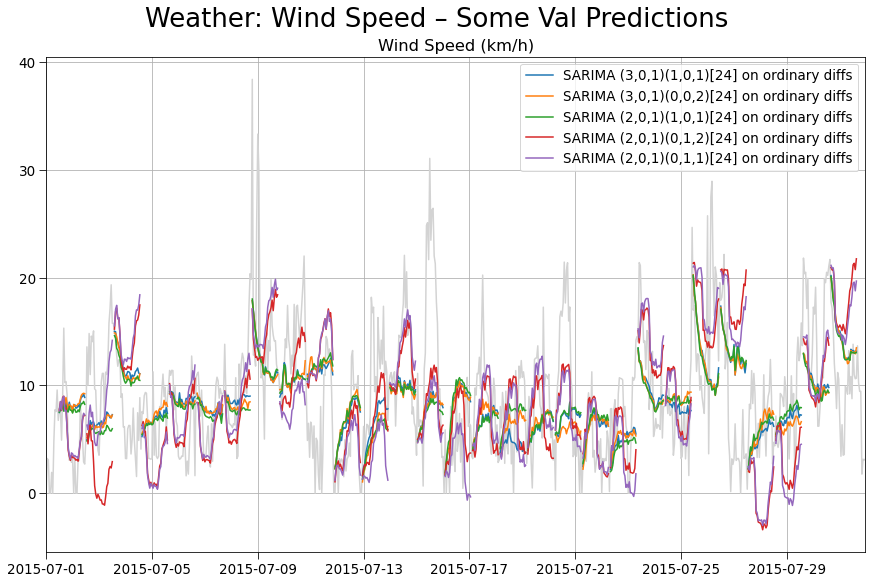

<IPython.core.display.Javascript object>

In [15]:
fig_time_delta = timedelta(hours=0)
short_val_intv = tss.Interval(ts, datetime(2015, 7, 1), datetime(2015, 8, 1))
fig = plot_ground_truth(
    short_val_intv,
    mode="val",
    data_type=data_type,
    data_name=data_name,
    color="lightgrey",
)
for ((model, version), preds), color in zip(val_preds.items(), mcolors.TABLEAU_COLORS):
    plot_model_test_prediction(
        short_val_intv,
        fig_time_delta,
        preds,
        model_name=model,
        model_version=version,
        fig=fig,
        color=color,
    )
display(fig)

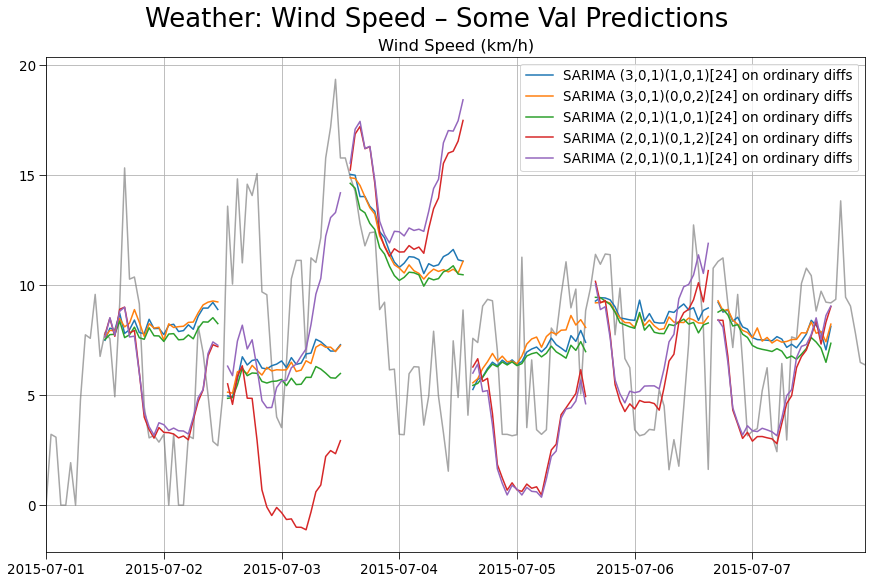

<IPython.core.display.Javascript object>

In [16]:
fig_time_delta = timedelta(hours=0)
short_val_intv = tss.Interval(ts, datetime(2015, 7, 1), datetime(2015, 7, 8))
fig = plot_ground_truth(
    short_val_intv,
    mode="val",
    data_type=data_type,
    data_name=data_name,
    color="grey",
    alpha=0.7,
)
for ((model, version), preds), color in zip(val_preds.items(), mcolors.TABLEAU_COLORS):
    plot_model_test_prediction(
        short_val_intv,
        fig_time_delta,
        preds,
        model_name=model,
        model_version=version,
        fig=fig,
        color=color,
    )
display(fig)